In [10]:
import geopandas as gpd
import pandas as pd
import pyproj

In [11]:
Sidewalk_Geo = gpd.read_file('Sidewalk_Inventory.shp')

In [12]:
Sidewalk_Geo = Sidewalk_Geo.to_crs(epsg=3857)
Sidewalk_Geo.crs
# Sidewalk_Geo.plot(figsize=(10, 11))

{'init': 'epsg:3857', 'no_defs': True}

In [380]:
import contextily as ctx
def add_basemap(ax, zoom, url='http://tile.stamen.com/terrain/tileZ/tileX/tileY.png'):
    xmin, xmax, ymin, ymax = -7925000, -7895000, 5195000, 5220000
#     xmin, xmax, ymin, ymax = -7915000, -7905000, 5210000, 5218000
    basemap, extent = ctx.bounds2img(xmin, ymin, xmax, ymax, zoom=zoom, url=url)
    ax.imshow(basemap, extent=extent, interpolation='bilinear')
    ax.axis((xmin, xmax, ymin, ymax))
    
# Convert coordinates of a geopandas and plot on a bg map
def plot_on_map(geodf, col='r'):
    geodf.plot(figsize=(10, 10))
    ax = geodf.plot(figsize=(15, 15), alpha=0.5, edgecolor=col, linewidth = 0.4, markersize = 1)
    add_basemap(ax, zoom=13)
    return ax
# plot_on_map(Sidewalk_Geo)

In [15]:
from geopandas import GeoDataFrame
from shapely.geometry import Point


pd_StreetLights = pd.read_csv('streetlight-locations.csv')
pd_StreetLights.columns
geo_Street = gpd.GeoDataFrame(pd_StreetLights.drop(['the_geom', 'Lat', 'Long'], axis=1),
                             crs={'init': 'epsg:4326'}, # need to assign a CRS for CSV, CSV by default does not carry it
                             geometry=[Point(xy) for xy in zip(pd_StreetLights.Long, pd_StreetLights.Lat)])
geo_Street.crs
geo_Street_crs = geo_Street.to_crs(epsg=3857)

In [16]:
geo_StreetLights = geo_Street_crs

In [2]:
!pip install geoplot

     |████████████████████████████████| 8.9MB 4.1MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 51kB 2.3MB/s eta 0:00:01
     |████████████████████████████████| 225kB 2.1MB/s eta 0:00:01
  ERROR: Command errored out with exit status 1:
   command: /Users/jblee/anaconda3/bin/python /Users/jblee/anaconda3/lib/python3.6/site-packages/pip/_vendor/pep517/_in_process.py build_wheel /var/folders/5j/s7_d5c_j2gvbt2b601lk60vm0000gn/T/tmpcq3t6dgf
       cwd: /private/var/folders/5j/s7_d5c_j2gvbt2b601lk60vm0000gn/T/pip-install-4decdzhz/cartopy
  Complete output (270 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build/lib.macosx-10.9-x86_64-3.6
  creating build/lib.macosx-10.9-x86_64-3.6/cartopy
  copying lib/cartopy/_version.py -> build/lib.macosx-10.9-x86_64-3.6/cartopy
  copying lib/cartopy/_epsg.py -> build/lib.mac

Failed to build cartopy
  Created wheel for mapclassify: filename=mapclassify-2.2.0-cp36-none-any.whl size=47029 sha256=f1f4b81dd3077344b491412b23b316975b3c0377b2d625d72b3486a7ba4d0f7b
  Stored in directory: /Users/jblee/Library/Caches/pip/wheels/96/0c/c1/b2bce9fc10da2e6c6befc9fe5929adca7c71b7c4abd1fc42f0
  Created wheel for pyshp: filename=pyshp-2.1.0-cp36-none-any.whl size=32607 sha256=0accac11367d8e8fad42b1ecccf55a98fac0d5d38f6742fcf225d8fdfe1bd1e7
  Stored in directory: /Users/jblee/Library/Caches/pip/wheels/a6/0c/de/321b5192ad416b328975a2f0385f72c64db4656501eba7cc1a
Successfully built mapclassify pyshp
ERROR: Could not build wheels for cartopy which use PEP 517 and cannot be installed directly


In [1]:
import geoplot as gplt
import geoplot.crs as gcrs
ax = gplt.kdeplot(
    geo_Street, cmap='viridis', projection=gcrs.WebMercator(), figsize=(12, 12),
    shade=True
)

ModuleNotFoundError: No module named 'geoplot'

/Users/jblee/anaconda3/lib/python3.6/site-packages/contextily/tile.py:199: FutureWarning: The url format using 'tileX', 'tileY', 'tileZ' as placeholders is deprecated. Please use '{x}', '{y}', '{z}' instead.
  FutureWarning,


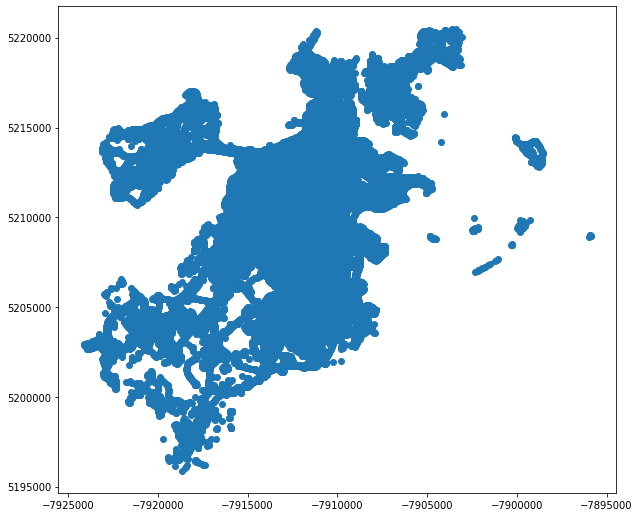

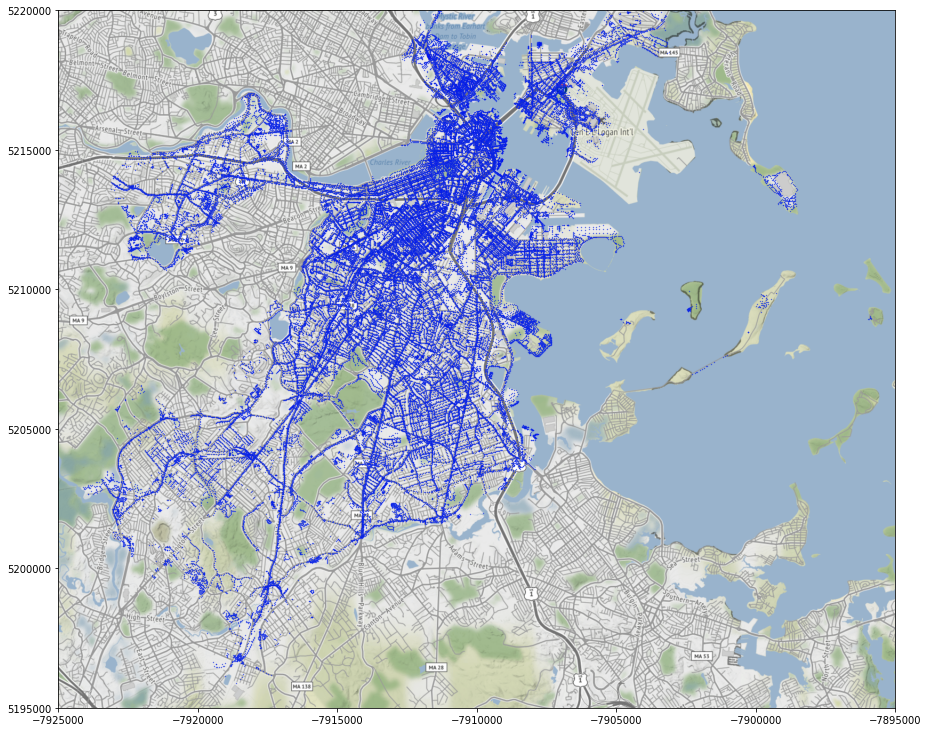

In [452]:
plot_on_map(geo_StreetLights, 'b')

In [411]:
import numpy as np
import itertools
from operator import itemgetter
from scipy.spatial import cKDTree
from shapely.geometry import Point, LineString, Polygon

def ckdnearest(gdA, gdB):
    nA = np.array(list(zip(gdA.geometry.x, gdA.geometry.y)) )
    nB = np.array(list(zip(gdB.geometry.x, gdB.geometry.y)) )
    btree = cKDTree(nB)
    dist, idx = btree.query(nA, k=1)
    gdf = pd.concat(
        [gdA.reset_index(drop=True), gdB.loc[idx, gdB.columns != 'geometry'].reset_index(drop=True),
         pd.Series(dist, name='dist')], axis=1)
    return gdf
geo_StreetLights

Sidewalk_Geo

OBJECTID SWK_ID                new_insp_d             INSP MATERIAL  \
0      1         1      2013-12-26T00:00:00.000Z  Tan Pham         OT        
1      2         2      2013-12-26T00:00:00.000Z  Derek Chan       CC        
2      3         3      2013-12-26T00:00:00.000Z  Derek Chan       CC        
3      4         4      2013-12-26T00:00:00.000Z  Derek Chan       CC        
4      5         5      2013-12-26T00:00:00.000Z  Derek Chan       CC        
5      6         6      2013-12-17T00:00:00.000Z  Derek Chan       CC        
6      7         7      2013-12-26T00:00:00.000Z  Derek Chan       CC        
7      8         8      2013-12-26T00:00:00.000Z  Derek Chan       CC        
8      9         9      2014-12-26T00:00:00.000Z  Mike Haggerty    BC        
9      10        10     2014-12-18T00:00:00.000Z  Serge Lindor     CC        
10     11        11     2014-12-08T00:00:00.000Z  Derek Chan       CC        
11     12        12     2014-10-29T00:00:00.000Z  Derek Chan       CC        
12     13        13     2014-10-29T00:00:00.000Z  Derek Chan       CC        
13     14        14     1970-01-01T00:00:00.000Z  Mike Haggerty    BC        
14     15        15     2014-12-26T00:00:00.000Z  Kevin Linskey    None      
15     16        16     1970-01-01T00:00:00.000Z  Mike Haggerty    CC        
16     17        17     1970-01-01T00:00:00.000Z  Mike Haggerty    CC        
17     18        18     1970-01-01T00:00:00.000Z  Mike Haggerty    CC        
18     19        19     1970-01-01T00:00:00.000Z  Mike Haggerty    CC        
19     20        20     2014-12-23T00:00:00.000Z  Serge Lindor     CC        
20     21        21     2014-12-26T00:00:00.000Z  Kevin Linskey    None      
21     22        22     2014-12-26T00:00:00.000Z  Danny Moy        CC        
22     23        23     2014-12-26T00:00:00.000Z  Henry St. Fleur  CC        
23     24        24     1970-01-01T00:00:00.000Z  Mike Haggerty    BR        
24     25        25     1970-01-01T00:00:00.000Z  Mike Haggerty    BR        
25     26        26     2015-01-12T00:00:00.000Z  Al Vargas        GB        
26     27        28     2014-01-13T00:00:00.000Z  Sierra Tilton    CC        
27     28        29     2014-01-13T00:00:00.000Z  Brian Forde      CC        
28     29        24506  2014-01-13T00:00:00.000Z  Derek Chan       CC        
29     30        24507  1970-01-01T00:00:00.000Z  Mike Haggerty    CC        
...    ..          ...                       ...            ...    ..        
24697  24698     24475  1970-01-01T00:00:00.000Z  BWT              CC        
24698  24699     24476  2014-11-15T00:00:00.000Z  Kevin Linskey    CC        
24699  24700     24477  2014-11-15T00:00:00.000Z  Kevin Linskey    CC        
24700  24701     24478  2014-11-28T00:00:00.000Z  Henry St. Fleur  CC        
24701  24702     24479  1970-01-01T00:00:00.000Z  Mike Haggerty    GB        
24702  24703     24480  2014-12-16T00:00:00.000Z  Serge Lindor     CC        
24703  24704     24481  2014-10-08T00:00:00.000Z  Serge Lindor     None      
24704  24705     24482  1970-01-01T00:00:00.000Z  Mike Haggerty    None      
24705  24706     24483  2014-11-08T00:00:00.000Z  John Vozzella    CC        
24706  24707     24485  2014-11-26T00:00:00.000Z  Al Vargas        CC        
24707  24708     24486  2014-11-26T00:00:00.000Z  Kevin Linskey    CC        
24708  24709     24487  2014-11-26T00:00:00.000Z  Serge Lindor     CC        
24709  24710     24488  1970-01-01T00:00:00.000Z  Mike Haggerty    CC        
24710  24711     24489  2014-12-16T00:00:00.000Z  Henry St. Fleur  CC        
24711  24712     24490  2014-11-15T00:00:00.000Z  Serge Lindor     CC        
24712  24713     24491  2014-11-15T00:00:00.000Z  Serge Lindor     CC        
24713  24714     24492  2014-11-01T00:00:00.000Z  Kevin Linskey    None      
24714  24715     24493  2014-11-07T00:00:00.000Z  Kevin Linskey    None      
24715  24716     24494  2014-12-16T00:00:00.000Z  Marty Lee        BC        
24716  24717     24495  2014-

In [19]:
import numpy as np
import itertools
from operator import itemgetter
from shapely.geometry import Point, LineString, Polygon
from scipy.spatial import KDTree 

polys = Sidewalk_Geo.geometry

testPoints = geo_StreetLights.geometry

# select basis polygons
# it works with any pair of polygons that have non zero distance
basePolygon0 = polys[0]
basePolygon1 = polys[1]

# compute tree query
def buildQuery(point):
    distToBasePolygon0 = basePolygon0.distance(point)
    distToBasePolygon1 = basePolygon1.distance(point)
    return np.array([distToBasePolygon0,distToBasePolygon1])


distances = np.array([buildQuery(poly) for poly in polys])

# build the KD tree
tree = KDTree(distances)

In [23]:

# print("poly : ", polys)
print("testPoint : ",testPoints[0])
print("geo_StreetLights : ",geo_StreetLights.geometry[0])
for p in testPoints[:1]:
    q = buildQuery(p)
    output = tree.query(q)
    print(output)
   
print(basePolygon0.distance(testPoints[0]))
print(basePolygon1.distance(testPoints[0]))

print(basePolygon0.distance(Sidewalk_Geo.geometry[12372]))
print(basePolygon1.distance(Sidewalk_Geo.geometry[12372]))

print(basePolygon0.distance(Sidewalk_Geo.geometry[16131]))
print(basePolygon1.distance(Sidewalk_Geo.geometry[16131]))

print(len(geo_StreetLights))
print(len(Sidewalk_Geo))
# Sidewalk_Geo.geometry[12372].distance(geo_StreetLights.geometry[0])
print(Sidewalk_Geo.geometry.distance(testPoints[0]).idxmin())
# for idx in range(0, len(geo_StreetLights)):
#     print(Sidewalk_Geo.geometry.distance(geo_StreetLights.geometry[idx]).idxmin())

testPoint :  POINT (-7912149.068070769 5214028.669008375)
geo_StreetLights :  POINT (-7912149.068070769 5214028.669008375)
(0.8695347029826583, 12373)
4204.467530606411
4152.24800254677
4122.938825233563
4070.479432789931
4111.383868706843
4059.6591632336954
74065
24727
16132


In [93]:
#import Pool
from multiprocessing import Pool
#Define a worker — a function which will be executed in parallel
# output = {}
# output[0] = []
# output[1] = []
# output[2] = []
# output[3] = []

# arg = [[0, output[0]], [1, output[1]], [2, output[2]], [3, output[3]]]
# print(Sidewalk_Geo[18516*0:18516*(0+1)].geometry.distance(geo_StreetLights.geometry[1]).min())

# def worker(input):
#     for idx in range(18516*input[0], 18516*(input[0]+1)):
#         if idx%10000 == 0:
#             print(idx)
#         input[1].append(Sidewalk_Geo.geometry.distance(geo_StreetLights.geometry[idx]).idxmin())
#     return input[1]
# #Assuming you want to use 3 processors
# num_processors = 4

# #Create a pool of processors
# p=Pool(processes = num_processors)
# #get them to work in parallel
# out = p.map(worker, arg)
print(out)

0
20000
40000
60000
10000
30000
50000
70000
[[16132, 16132, 16132, 16131, 16133, 16133, 16133, 16122, 4872, 4872, 5426, 1088, 4872, 4872, 1088, 1088, 5426, 1088, 5426, 5426, 5426, 5426, 5428, 5830, 5830, 5428, 5885, 4872, 4872, 4872, 5427, 10211, 22318, 22387, 9256, 9257, 22389, 9256, 22388, 22388, 9256, 9256, 9257, 9257, 1593, 1593, 1593, 1593, 9854, 9257, 1593, 1593, 15537, 15537, 15537, 15537, 361, 9283, 9283, 22318, 22318, 22387, 22387, 22387, 9747, 9747, 9746, 18467, 18467, 18467, 9256, 9738, 9746, 22318, 22511, 9746, 9256, 9255, 15510, 15510, 15887, 15509, 15509, 15509, 8759, 4177, 22817, 15887, 15887, 15887, 22734, 22817, 22817, 22222, 8759, 22222, 9255, 24058, 24058, 24055, 24055, 24055, 24055, 5826, 5826, 5826, 5826, 5863, 5863, 5864, 22245, 22245, 22245, 1585, 22817, 6680, 6680, 6680, 17993, 17993, 17993, 17993, 17993, 17993, 17993, 17993, 22223, 22223, 22223, 22817, 22817, 17993, 17993, 6680, 6680, 6680, 6680, 6680, 15887, 15887, 15887, 22817, 16596, 16596, 16596, 22734, 227

Process ForkPoolWorker-455:
Process ForkPoolWorker-456:
Process ForkPoolWorker-453:
Process ForkPoolWorker-454:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/jblee/anaconda3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/Users/jblee/anaconda3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/Users/jblee/anaconda3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/Users/jblee/anaconda3/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/jblee/anaconda3/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/jblee/anaconda3/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/jblee/anaconda3/lib/p

In [94]:
print(out)

[[16132, 16132, 16132, 16131, 16133, 16133, 16133, 16122, 4872, 4872, 5426, 1088, 4872, 4872, 1088, 1088, 5426, 1088, 5426, 5426, 5426, 5426, 5428, 5830, 5830, 5428, 5885, 4872, 4872, 4872, 5427, 10211, 22318, 22387, 9256, 9257, 22389, 9256, 22388, 22388, 9256, 9256, 9257, 9257, 1593, 1593, 1593, 1593, 9854, 9257, 1593, 1593, 15537, 15537, 15537, 15537, 361, 9283, 9283, 22318, 22318, 22387, 22387, 22387, 9747, 9747, 9746, 18467, 18467, 18467, 9256, 9738, 9746, 22318, 22511, 9746, 9256, 9255, 15510, 15510, 15887, 15509, 15509, 15509, 8759, 4177, 22817, 15887, 15887, 15887, 22734, 22817, 22817, 22222, 8759, 22222, 9255, 24058, 24058, 24055, 24055, 24055, 24055, 5826, 5826, 5826, 5826, 5863, 5863, 5864, 22245, 22245, 22245, 1585, 22817, 6680, 6680, 6680, 17993, 17993, 17993, 17993, 17993, 17993, 17993, 17993, 22223, 22223, 22223, 22817, 22817, 17993, 17993, 6680, 6680, 6680, 6680, 6680, 15887, 15887, 15887, 22817, 16596, 16596, 16596, 22734, 22734, 22222, 22222, 22222, 15509, 15509, 16109

In [95]:
from pandas.core.common import flatten

In [96]:
test = out
flat_test = list(flatten(test))

In [98]:
print(len(flat_test))

74064


In [99]:
print(len(geo_StreetLights))

74065


In [101]:
Sidewalk_Geo.head()

,OBJECTID,SWK_ID,new_insp_d,INSP,MATERIAL,SWK_WIDTH,SWK_SLOPE,DAM_LENGTH,DAM_WIDTH,SCI,...,Snow_Route,SEG_ID,SIDE,ROUTE,inspected,Shape_STAr,Shape_STLe,ShapeSTAre,ShapeSTLen,geometry
0,1,1,2013-12-26T00:00:00.000Z,Tan Pham,OT,7,2.2,15,5.5,97.7,...,1A-3-1,ALBIO1_0,LEFT,None,yes,3648.357910,1448.226939,3648.361328,1448.226939,"POLYGON ((-7911438.180 5218322.662, -7911432.9..."
1,2,2,2013-12-26T00:00:00.000Z,Derek Chan,CC,6,2.5,101,6,47.1,...,1A-3-1,AUBUR1_0,LEFT,None,yes,1145.142090,464.846589,1145.141602,464.846589,"POLYGON ((-7911445.217 5218145.840, -7911449.9..."
2,3,3,2013-12-26T00:00:00.000Z,Derek Chan,CC,6,3,97,6,63.7,...,1A-3-1,AUBUR1_0,RIGHT,None,yes,1603.231201,529.743387,1603.230713,529.743387,"POLYGON ((-7911416.445 5218208.909, -7911421.9..."
3,4,4,2013-12-26T00:00:00.000Z,Derek Chan,CC,6,5,30,6,56.2,...,1A-3-1,AUBUR1_612,RIGHT,None,yes,411.096191,145.202968,411.096436,145.202968,"POLYGON ((-7911328.447 5218341.728, -7911330.9..."
4,5,5,2013-12-26T00:00:00.000Z,Derek Chan,CC,5.5,1.8,25,5.5,86.7,...,1A-3-1,ALBIO1_0,RIGHT,None,yes,1031.328369,418.812686,1031.329102,418.812686,"POLYGON ((-7911477.444 5218265.150, -7911484.7..."


In [104]:
test_SL=geo_StreetLights
flat_test.append('nan')

In [127]:
# test_SL['StreetIdx']=np.array(flat_test)
# test_SL.drop(74064, inplace=True)

,OBJECTID,TYPE,geometry,StreetIdx
0,1,LIGHT,POINT (-7912149.068 5214028.669),16132
1,2,LIGHT,POINT (-7912075.300 5214057.066),16132
2,3,LIGHT,POINT (-7912007.748 5214083.089),16132
3,4,LIGHT,POINT (-7911966.432 5214088.406),16131
4,5,LIGHT,POINT (-7911879.276 5214126.779),16133
...,...,...,...,...
74059,74060,LIGHT,POINT (-7912641.339 5211278.444),13096
74060,74061,LIGHT,POINT (-7912626.314 5211281.240),13096
74061,74062,LIGHT,POINT (-7912563.548 5211253.668),20713
74062,74063,LIGHT,POINT (-7915631.517 5206214.793),6826


In [128]:
test_SL.to_file("StreetLights_with_StreetIndex.shp")

In [129]:
STLight_Geo_wSTInd = gpd.read_file('StreetLights_with_StreetIndex.shp')

In [130]:
STLight_Geo_wSTInd.tail()

,OBJECTID,TYPE,StreetIdx,geometry
74059,74060,LIGHT,13096,POINT (-7912641.339 5211278.444)
74060,74061,LIGHT,13096,POINT (-7912626.314 5211281.240)
74061,74062,LIGHT,20713,POINT (-7912563.548 5211253.668)
74062,74063,LIGHT,6826,POINT (-7915631.517 5206214.793)
74063,74064,LIGHT,6826,POINT (-7915645.038 5206226.329)


In [131]:
STL_count = STLight_Geo_wSTInd['StreetIdx'].value_counts()
# masegs['crash'] = 0
# masegs.iloc[crash_count.index.astype(int), masegs.columns == 'crash'] = crash_count.values
# masegs

In [132]:
STL_count

24615    411
18259    360
13424    276
3725     239
9987     211
        ... 
17171      1
8508       1
24634      1
10368      1
18145      1
Name: StreetIdx, Length: 16169, dtype: int64

In [133]:
temp_SidewalkGet = Sidewalk_Geo

In [134]:
temp_SidewalkGet['NumStreetLight'] = 0

In [135]:
STL_count.index.astype(int)

Int64Index([24615, 18259, 13424,  3725,  9987, 11534, 19474, 12432, 22720,
            22541,
            ...
             4524,  4392,  9710,  4865, 17644, 17171,  8508, 24634, 10368,
            18145],
           dtype='int64', length=16169)

In [139]:
temp_SidewalkGet.iloc[STL_count.index.astype(int), temp_SidewalkGet.columns == 'NumStreetLight'] = STL_count.values

In [140]:
temp_SidewalkGet

,OBJECTID,SWK_ID,new_insp_d,INSP,MATERIAL,SWK_WIDTH,SWK_SLOPE,DAM_LENGTH,DAM_WIDTH,SCI,...,SEG_ID,SIDE,ROUTE,inspected,Shape_STAr,Shape_STLe,ShapeSTAre,ShapeSTLen,geometry,NumStreetLight
0,1,1,2013-12-26T00:00:00.000Z,Tan Pham,OT,7,2.2,15,5.5,97.7,...,ALBIO1_0,LEFT,None,yes,3648.357910,1448.226939,3648.361328,1448.226939,"POLYGON ((-7911438.180 5218322.662, -7911432.9...",10
1,2,2,2013-12-26T00:00:00.000Z,Derek Chan,CC,6,2.5,101,6,47.1,...,AUBUR1_0,LEFT,None,yes,1145.142090,464.846589,1145.141602,464.846589,"POLYGON ((-7911445.217 5218145.840, -7911449.9...",2
2,3,3,2013-12-26T00:00:00.000Z,Derek Chan,CC,6,3,97,6,63.7,...,AUBUR1_0,RIGHT,None,yes,1603.231201,529.743387,1603.230713,529.743387,"POLYGON ((-7911416.445 5218208.909, -7911421.9...",2
3,4,4,2013-12-26T00:00:00.000Z,Derek Chan,CC,6,5,30,6,56.2,...,AUBUR1_612,RIGHT,None,yes,411.096191,145.202968,411.096436,145.202968,"POLYGON ((-7911328.447 5218341.728, -7911330.9...",1
4,5,5,2013-12-26T00:00:00.000Z,Derek Chan,CC,5.5,1.8,25,5.5,86.7,...,ALBIO1_0,RIGHT,None,yes,1031.328369,418.812686,1031.329102,418.812686,"POLYGON ((-7911477.444 5218265.150, -7911484.7...",4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24722,24723,24501,1970-01-01T00:00:00.000Z,Mike Haggerty,CC,7.5,2.8,5,7.5,97.4,...,WASHI1_37867,RIGHT,None,yes,1423.772705,465.479303,1423.772949,465.479303,"MULTIPOLYGON (((-7919121.613 5202514.839, -791...",2
24723,24724,24502,1970-01-01T00:00:00.000Z,Mike Haggerty,CC,6,2.3,170,6,54.9,...,WASHI1_38272,RIGHT,None,yes,2262.404053,676.697980,2262.403076,676.697980,"MULTIPOLYGON (((-7919266.066 5202357.497, -791...",18
24724,24725,24503,2014-12-15T00:00:00.000Z,Serge Lindor,CC,5,2.2,100,5,67.1,...,WASHI8_3381,LEFT,None,yes,1519.529175,373.341756,1519.529175,373.341756,"MULTIPOLYGON (((-7920368.962 5201212.417, -792...",1
24725,24726,24504,2014-12-13T00:00:00.000Z,Kevin Linskey,CC,7,3.6,None,6,100.0,...,WOODA1_1598,LEFT,None,yes,2746.916504,903.915140,2746.917236,903.915140,"POLYGON ((-7920306.611 5202736.134, -7920307.0...",0


In [145]:
temp_SidewalkGet.iloc[17171]

OBJECTID                                                      17172
SWK_ID                                                        16798
new_insp_d                                 2014-08-12T00:00:00.000Z
INSP                                                   Serge Lindor
MATERIAL                                                         CC
SWK_WIDTH                                                         7
SWK_SLOPE                                                       2.4
DAM_LENGTH                                                       52
DAM_WIDTH                                                         7
SCI                                                            66.2
curb_type                                          Vertical Granite
CURB_REV                                                          4
areaway                                                        None
NOTES                                                          None
add_note                                        

In [146]:
temp_SidewalkGet.to_file("Sidewalk_with_nSTLights.shp")

In [156]:
temp_SidewalkGet['StreetLightDensity'] = (temp_SidewalkGet['NumStreetLight']/temp_SidewalkGet['ShapeSTAre'])*100

In [158]:
temp_SidewalkGet['StreetLightDensity'].max()

45.33480907581627

In [159]:
temp_SidewalkGet['StreetLightDensity'].min()

0.0

In [ ]:
temp_SidewalkGet.to_file("Sidewalk_with_n_density_STLights.shp")
import osmnx as ox
# temp_SidewalkGet

In [243]:
# temp_SidewalkGet.to_file("Sidewalk_with_n_density_STLights.geojson", driver='GeoJSON')
temp_SidewalkGet[:1000].centroid.to_file("Sidewalk_with_n_density_STLights_geoOnly.shp")

In [244]:
Sidewalk_with_n_density_STLights_geoOnly = gpd.read_file('Sidewalk_with_n_density_STLights_geoOnly.shp')

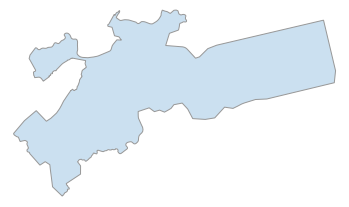

(<Figure size 432x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x6386cb518>)

In [274]:
import networkx as nx
import fiona
from shapely.geometry import shape
import networkx as nx

##### Create network #####
# draw graph
# graph = nx.read_shp('Sidewalk_with_n_density_STLights_geoOnly.shp', simplify=True, geom_attrs=True, strict=True)
# nx.draw(graph)

# graph_from_bbox
city = ox.gdf_from_place('Boston, MA, USA')
ox.plot_shape(ox.project_gdf(city))


# boston_poly = ox.gdf_from_place("Boston, Massachusetts, United States of America", buffer_dist=2000)
# G_projected = ox.project_graph(boston_poly)
# ox.plot_graph(G_projected)




# G = ox.graph_from_bbox(42.350326, 42.349923, -71.092873, -71.100365, network_type='walk')
# G_projected = ox.project_graph(G)
# ox.plot_graph(G_projected)

# G = ox.gdf_from_place('Bay State Road, Boston, MA, USA')
# G.crs
# gg = gpd.GeoDataFrame(G, crs={'init': 'epsg:4326'})
# gg.crs
# gg_crs = gg.to_crs(epsg=3857)
# gg_crs
# # plot_on_map(gg_crs, 'r')

In [275]:
G = ox.graph_from_place('Piedmont, California, USA', network_type='drive')

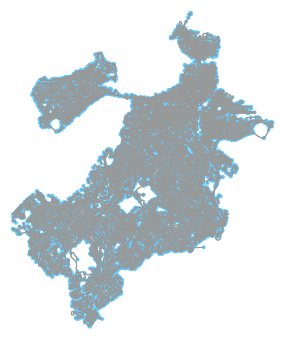

(<Figure size 349.435x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a560264a8>)

In [287]:
G = ox.graph_from_place('Boston, MA, USA', network_type='walk')
G_projected = ox.project_graph(G)
ox.plot_graph(G_projected)

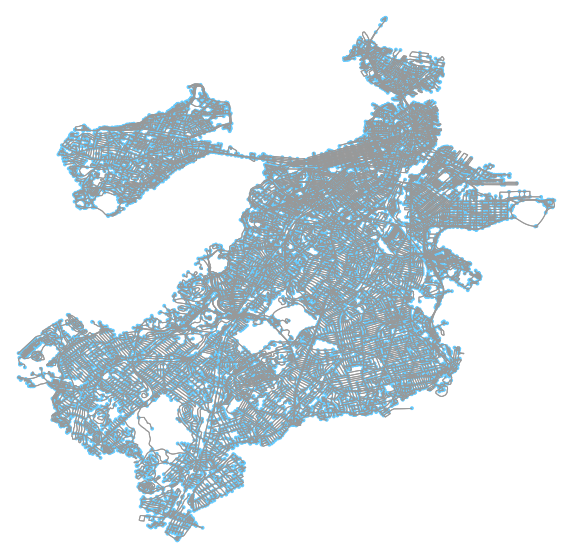

(<Figure size 720x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a4f17edd8>)

In [288]:
ox.plot_graph(G_projected, fig_height=10, fig_width=10)

In [289]:
G_projected

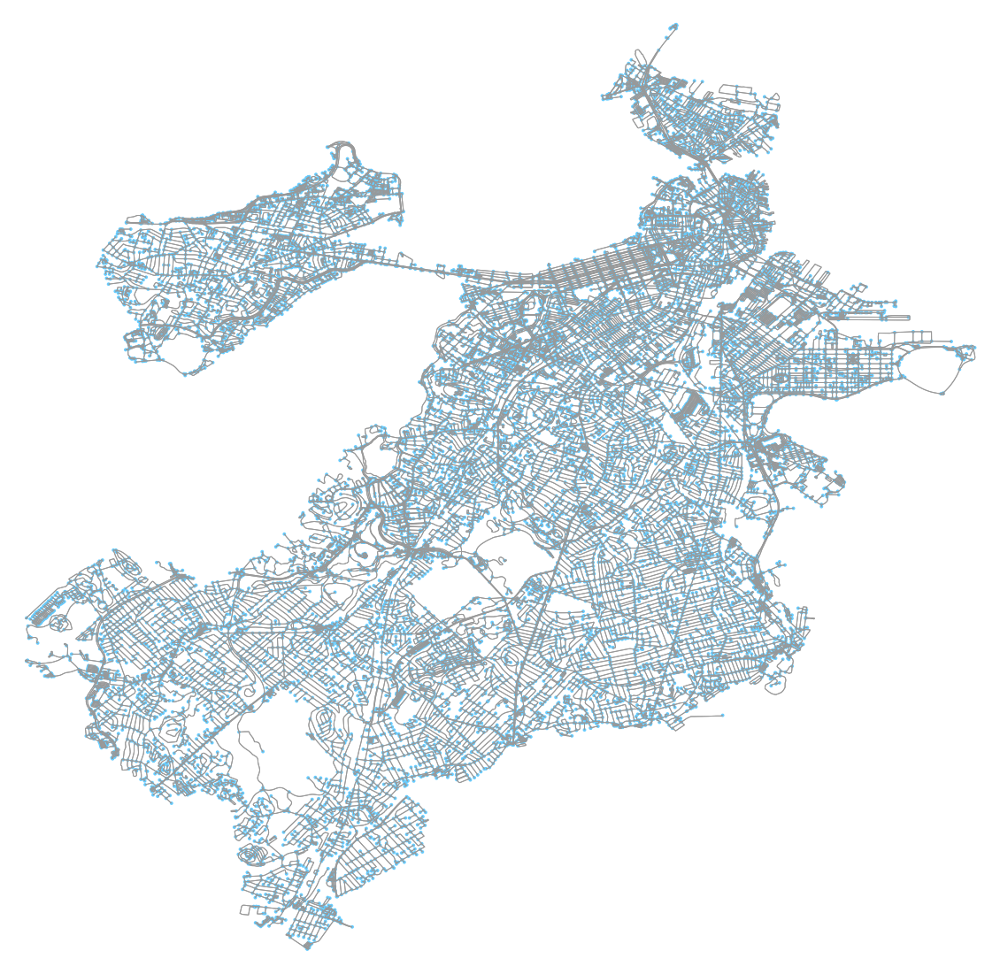

(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a5784b550>)

In [290]:
ox.plot_graph(G_projected, fig_height=20, fig_width=20)

In [308]:
nodesFromG, edgesFromG = ox.graph_to_gdfs(G_projected, nodes=True, edges=True)

In [309]:
edgesFromG.head(100)

,u,v,key,osmid,oneway,lanes,name,highway,width,length,geometry,maxspeed,ref,tunnel,service,junction,bridge,access,area
0,61341696,61341267,0,8652528,False,2,Park Plaza,secondary,29.9,44.954,"LINESTRING (329642.117 4690896.342, 329598.118...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,61341696,4779725263,0,426831017,False,2,Columbus Avenue,residential,23.8,7.915,"LINESTRING (329642.117 4690896.342, 329643.924...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,61341696,4779725246,0,8651073,False,2,Park Plaza,secondary,21.3,19.073,"LINESTRING (329642.117 4690896.342, 329649.142...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,61341697,61342333,0,8640801,False,1,Glenville Avenue,residential,12.2,23.799,"LINESTRING (324297.700 4690875.726, 324277.836...",25 mph,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,61341697,61341707,0,8640801,False,1,Glenville Avenue,residential,12.2,72.236,"LINESTRING (324297.700 4690875.726, 324324.209...",25 mph,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,61341744,61341746,0,8650875,False,2,Cushman Road,residential,11.6,109.265,"LINESTRING (323151.632 4691305.178, 323254.157...",25 mph,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96,61341744,61341582,0,8650875,False,2,Cushman Road,residential,11.6,103.490,"LINESTRING (323151.632 4691305.178, 323054.449...",25 mph,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97,61341746,61344062,0,8650414,False,1,Murdock Street,residential,12.2,51.610,"LINESTRING (323254.157 4691266.699, 323233.131...",25 mph,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98,61341746,61341747,0,8650414,False,1,Murdock Street,residential,12.2,51.880,"LINESTRING (323254.157 4691266.699, 323275.305...",25 mph,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [310]:
print(nodesFromG.crs)
print(edgesFromG.crs)

+proj=utm +zone=19 +ellps=WGS84 +datum=WGS84 +units=m +no_defs
+proj=utm +zone=19 +ellps=WGS84 +datum=WGS84 +units=m +no_defs


In [311]:
nodesFromG_crs = nodesFromG.to_crs(epsg=3857)
edgesFromG_crs = edgesFromG.to_crs(epsg=3857)

In [312]:
# nodesFromG_crs.head()
edgesFromG_crs.head()

,u,v,key,osmid,oneway,lanes,name,highway,width,length,geometry,maxspeed,ref,tunnel,service,junction,bridge,access,area
0,61341696,61341267,0,8652528,False,2,Park Plaza,secondary,29.9,44.954,"LINESTRING (-7911299.291 5213806.178, -7911358...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,61341696,4779725263,0,426831017,False,2,Columbus Avenue,residential,23.8,7.915,"LINESTRING (-7911299.291 5213806.178, -7911296...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,61341696,4779725246,0,8651073,False,2,Park Plaza,secondary,21.3,19.073,"LINESTRING (-7911299.291 5213806.178, -7911289...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,61341697,61342333,0,8640801,False,1,Glenville Avenue,residential,12.2,23.799,"LINESTRING (-7918517.280 5213599.183, -7918543...",25 mph,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,61341697,61341707,0,8640801,False,1,Glenville Avenue,residential,12.2,72.236,"LINESTRING (-7918517.280 5213599.183, -7918481...",25 mph,NaN,NaN,NaN,NaN,NaN,NaN,NaN


/Users/jblee/anaconda3/lib/python3.6/site-packages/contextily/tile.py:199: FutureWarning: The url format using 'tileX', 'tileY', 'tileZ' as placeholders is deprecated. Please use '{x}', '{y}', '{z}' instead.
  FutureWarning,


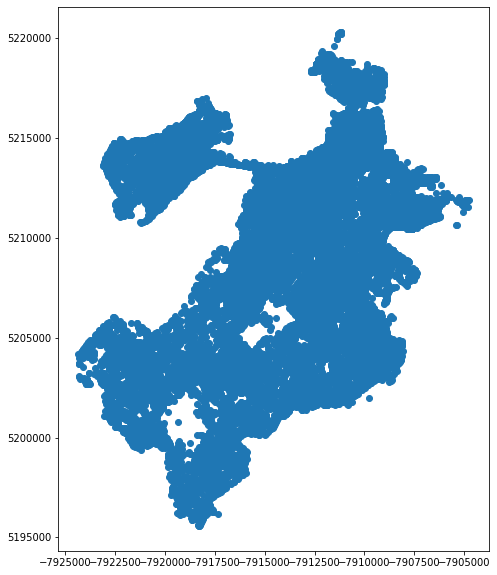

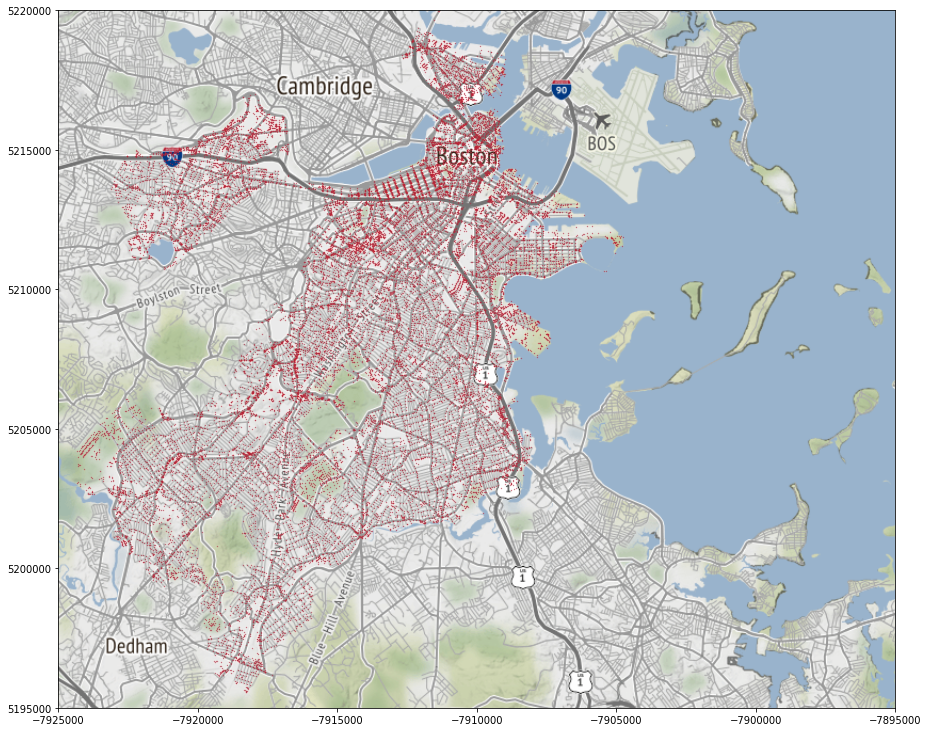

In [300]:
plot_on_map(nodesFromG_crs, 'r')

/Users/jblee/anaconda3/lib/python3.6/site-packages/contextily/tile.py:199: FutureWarning: The url format using 'tileX', 'tileY', 'tileZ' as placeholders is deprecated. Please use '{x}', '{y}', '{z}' instead.
  FutureWarning,


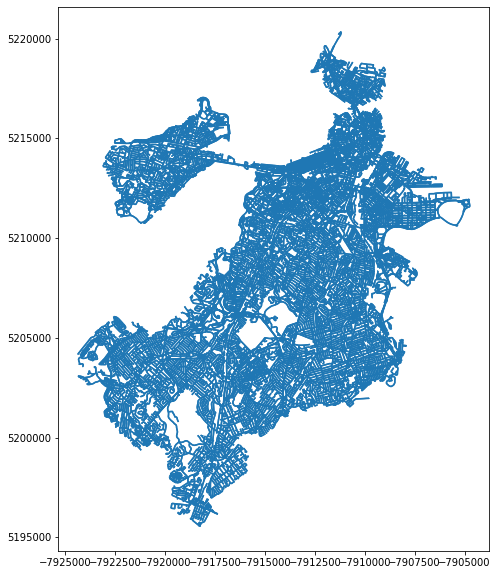

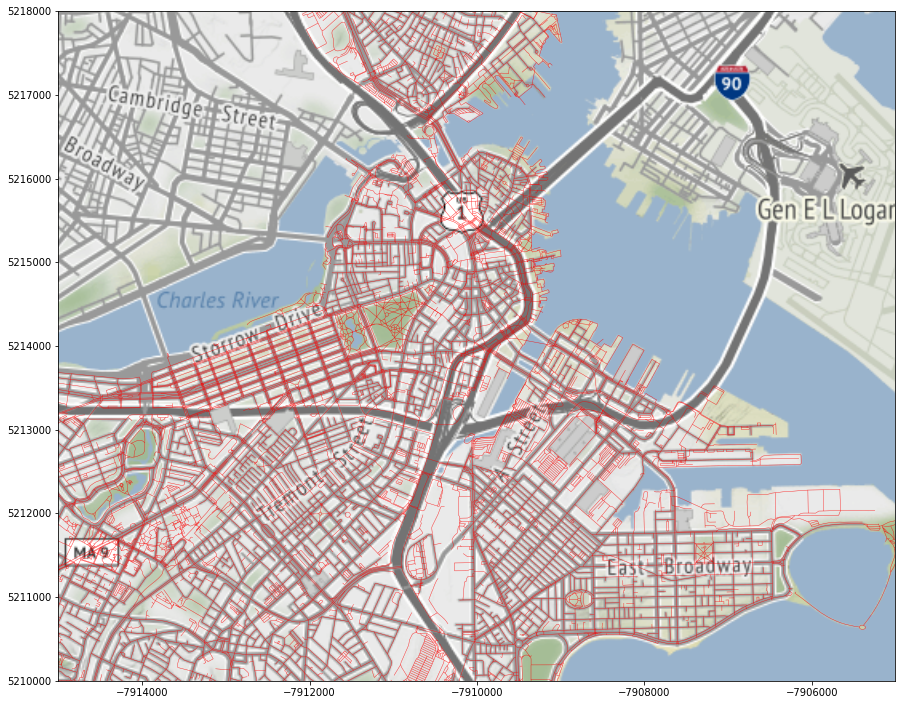

In [324]:
plot_on_map(edgesFromG_crs, 'r')

In [360]:
# print(edgesFromG_crs['geometry'][0].coords[0])
# print(edgesFromG_crs['geometry'][0].coords[1])

# print(edgesFromG_crs['geometry'][1].coords[0])
# print(edgesFromG_crs['geometry'][1].coords[1])

# print(len(edgesFromG_crs['geometry'][70313].coords))
for cod in edgesFromG_crs['geometry'][70313].coords:
    print(cod[0], "     ", cod[1])
# xmin, xmax, ymin, ymax = -7915000, -7905000, 5210000, 5218000

-7911167.889084303       5213825.669170024
-7911175.30296239       5213827.220667193
-7911182.215902767       5213827.7177488655
-7911184.787383006       5213827.672559622


In [340]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)
edgesFromG_crs['geometry']

0        LINESTRING (-7911299.291 5213806.178, -7911358.401 5213791.536)                                                    
1        LINESTRING (-7911299.291 5213806.178, -7911296.597 5213795.799)                                                    
2        LINESTRING (-7911299.291 5213806.178, -7911289.851 5213808.437, -7911274.166 5213812.203)                          
3        LINESTRING (-7918517.280 5213599.183, -7918543.663 5213580.656)                                                    
4        LINESTRING (-7918517.280 5213599.183, -7918481.992 5213620.723, -7918435.683 5213653.108)                          
                                                   ...                                                                      
70311    LINESTRING (-7921848.850 5213915.205, -7921898.275 5213904.359)                                                    
70312    LINESTRING (-7921848.850 5213915.205, -7921841.168 5213998.354)                                                    


In [401]:
# edgesFromG_crs_filtered = edgesFromG_crs[edgesFromG_crs.geometry.coords]


# result_df[result_df['_text'].apply(sentence_count) != 0]
def filter(df):
    within = 1
    for cod in df.coords:
        if cod[0] > -7915000 and cod[0] < -7905000:
            codx = 1
        else: codx = 0
        if cod[1] > 5210000 and cod[1] < 5218000:
            cody = 1
        else: cody = 0
        within = within * codx * cody
    return within
test = edgesFromG_crs        
filterd_edges=test[test['geometry'].apply(filter) != 0]
filterd_nodes=nodesFromG_crs[nodesFromG_crs['geometry'].apply(filter) != 0]


# # xmin, xmax, ymin, ymax = -7915000, -7905000, 5210000, 5218000

/Users/jblee/anaconda3/lib/python3.6/site-packages/contextily/tile.py:199: FutureWarning: The url format using 'tileX', 'tileY', 'tileZ' as placeholders is deprecated. Please use '{x}', '{y}', '{z}' instead.
  FutureWarning,


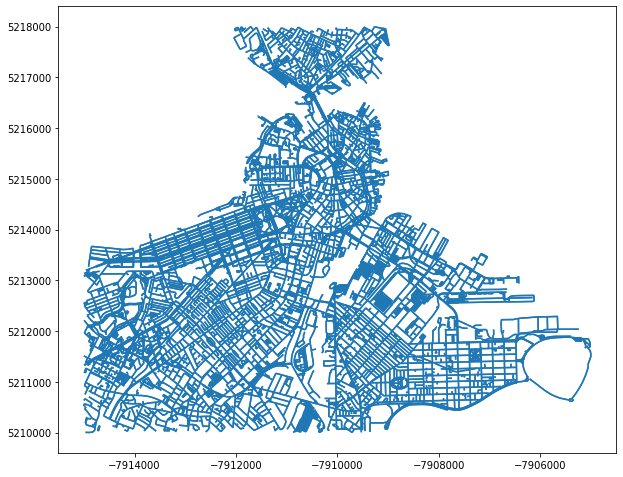

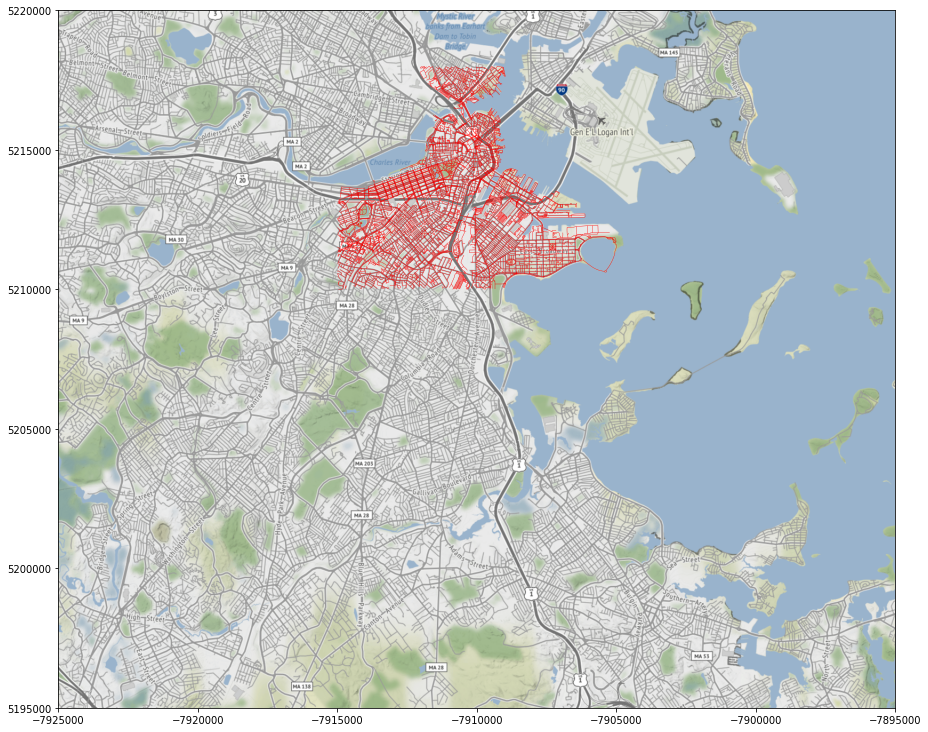

In [398]:
plot_on_map(filterd_edges, 'r')

In [399]:
filterd_edge_graph = momepy.gdf_to_nx(filterd_edges, approach='primal')

/Users/jblee/anaconda3/lib/python3.6/site-packages/contextily/tile.py:199: FutureWarning: The url format using 'tileX', 'tileY', 'tileZ' as placeholders is deprecated. Please use '{x}', '{y}', '{z}' instead.
  FutureWarning,


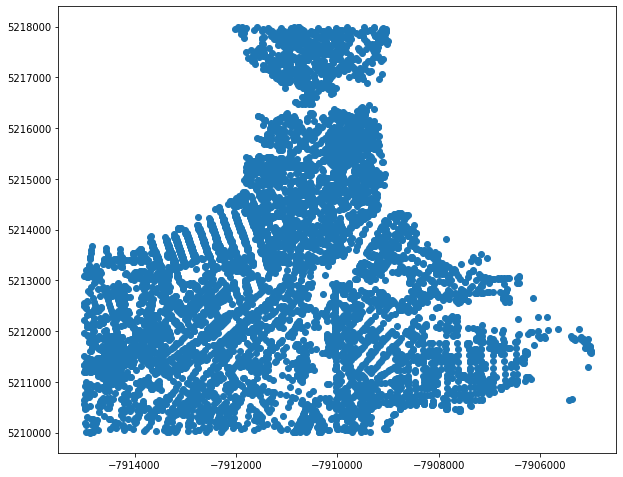

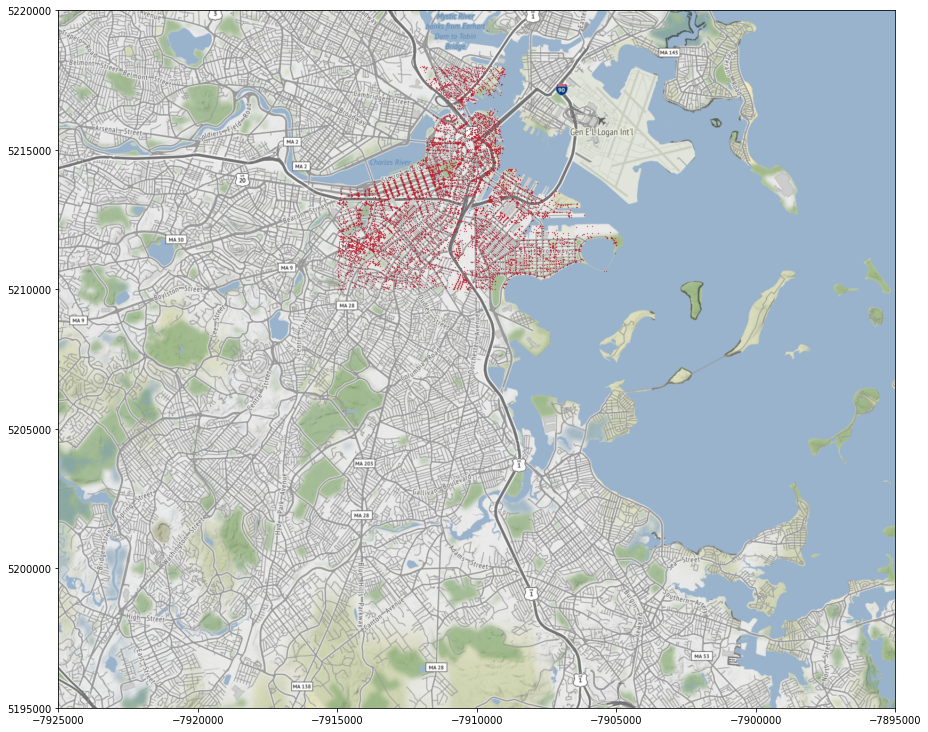

In [403]:
plot_on_map(filterd_nodes, 'r')
filterd_node_graph = momepy.gdf_to_nx(filterd_nodes, approach='primal')

In [404]:
U=nx.Graph()
U.add_edges_from(filterd_edge_graph.edges())
U.add_nodes_from(filterd_node_graph.nodes())
# ox.plot_graph(filterd_edge_graph, fig_height=10, fig_width=10, edge_color='r')

# route = nx.shortest_path(filterd_graph, np.random.choice(filterd_graph.nodes), np.random.choice(filterd_graph.nodes))
# ox.plot_graph_route(filterd_graph, route, fig_height=10, fig_width=10)

In [405]:
ox.plot_graph(U, fig_height=10, fig_width=10, edge_color='r')

TypeError: float() argument must be a string or a number, not 'NoneType'

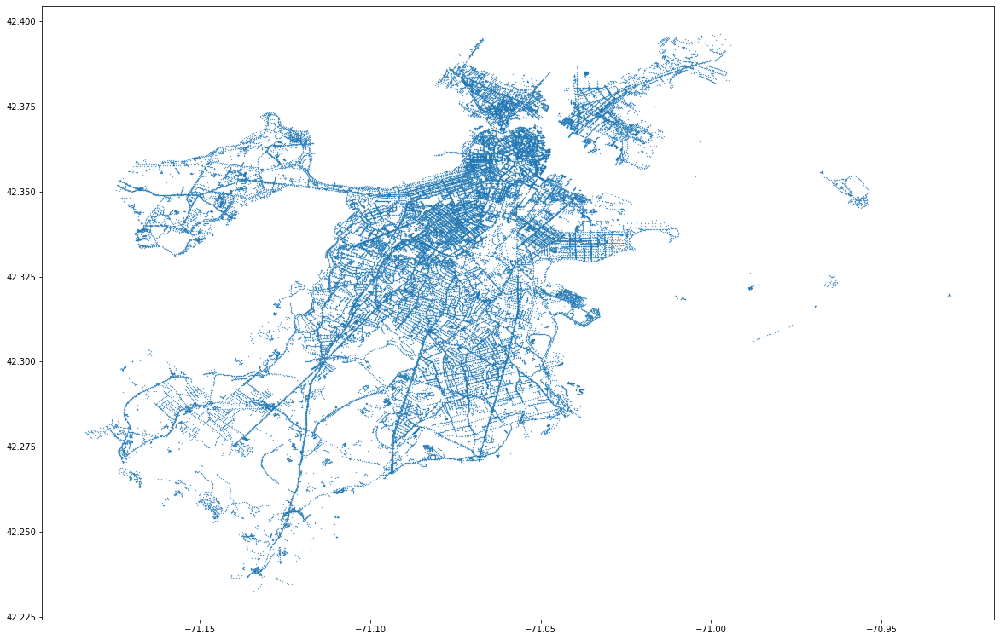

In [415]:
geo_Street.plot(figsize=(20, 20), markersize = 0.1)

# geodf.plot(figsize=(10, 10))
# G = ox.graph_from_bbox(37.79, 37.78, -122.41, -122.43, network_type='drive')
# G_projected = ox.project_graph(G)
# ox.plot_graph(G_projected)

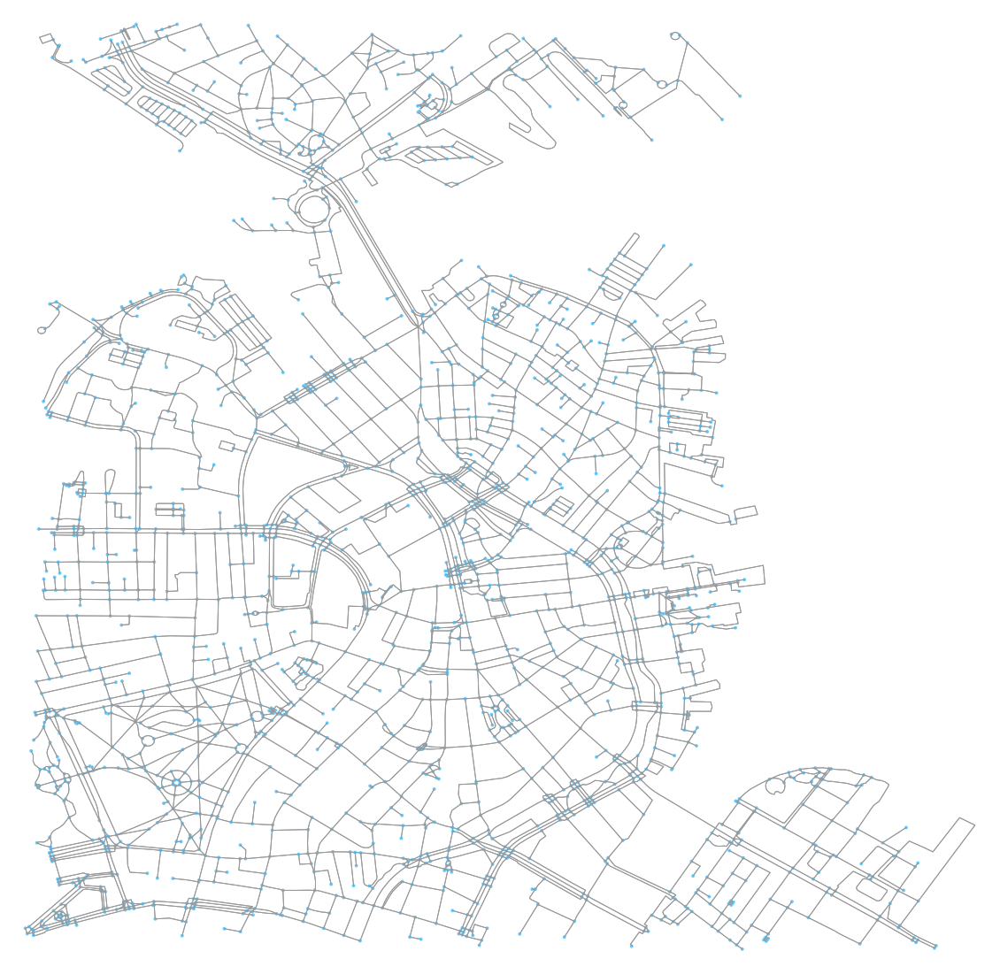

(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ac20c2f60>)

In [430]:
# Y : 42.375, 42.350, X : -71.07, -71.03
# G_test = ox.graph_from_bbox(42.400, 42.300, -71.00, -71.15, max_query_area_size=5000000000, network_type='walk')
G_test = ox.graph_from_bbox(42.4, 42.3, -71.05, -71.10, network_type='walk')
G_test_projected = ox.project_graph(G)
ox.plot_graph(G_test_projected, fig_height=20, fig_width=20)

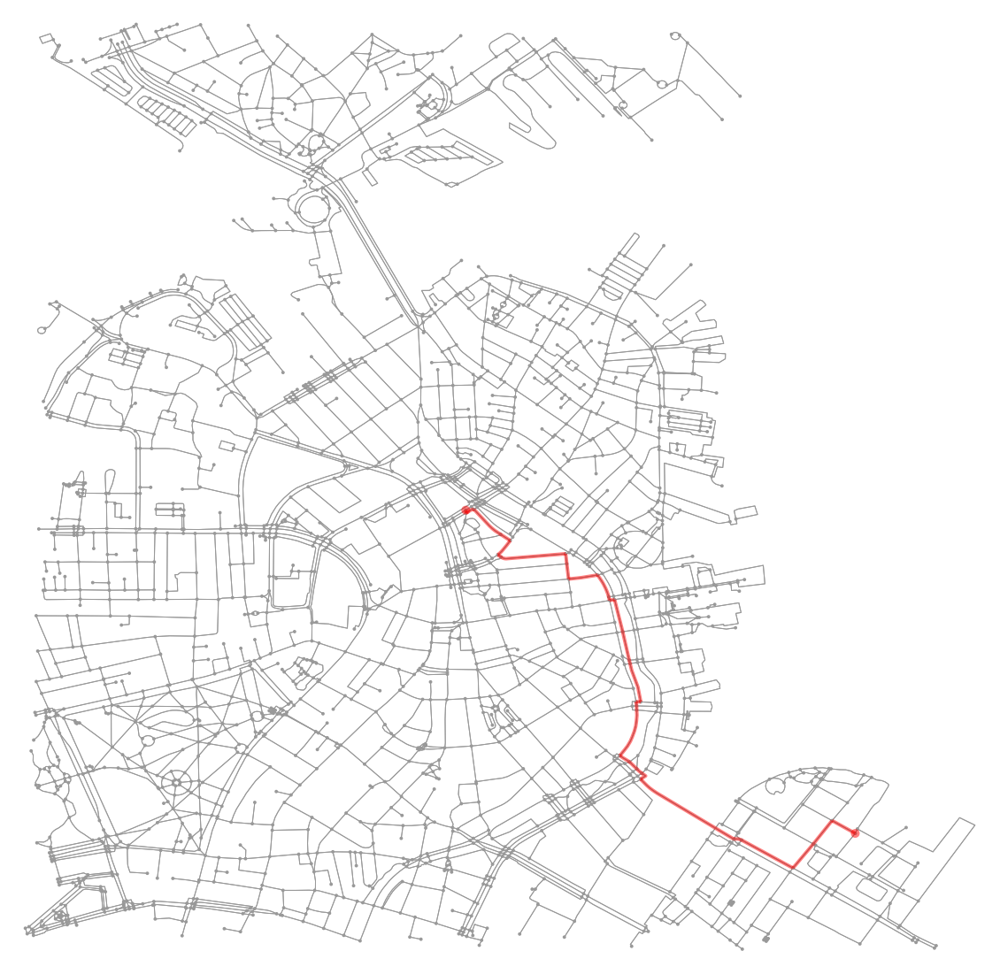

(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ac0baeb38>)

In [449]:
route = nx.shortest_path(G_test_projected, np.random.choice(G_test_projected.nodes), np.random.choice(G_test_projected.nodes))
ox.plot_graph_route(G_test_projected, route, fig_height=20, fig_width=20)

In [450]:
import folium

In [451]:
m = ox.plot_route_folium(G_test_projected, route, route_color='green')

ImportError: The folium package must be installed to use this optional feature.